In [3]:
from __future__ import annotations

from dataclasses import dataclass
from typing import Literal, Sequence
import random
import numpy as np


PitchClass = int
PitchClassRow = list[PitchClass]
RowFormType = Literal["P", "I", "R", "RI"]


def validate_pitch_class(pc: int, modulus: int = 12) -> None:
    if not isinstance(pc, (int, np.integer)):
        raise TypeError("Pitch class must be an integer.")

    pc = int(pc)

    if pc < 0 or pc >= modulus:
        raise ValueError(f"Pitch class must be in range 0 to {modulus - 1}.")


def validate_row(row: Sequence[int], modulus: int = 12) -> None:
    if len(row) != modulus:
        raise ValueError(f"Row must contain exactly {modulus} pitch classes.")
    for pc in row:
        validate_pitch_class(pc, modulus=modulus)
    if set(row) != set(range(modulus)):
        raise ValueError(f"Row must contain each pitch class from 0 to {modulus - 1} exactly once.")


def generate_row(modulus: int = 12, seed: int | None = None) -> PitchClassRow:
    rng = random.Random(seed)
    row = list(range(modulus))
    rng.shuffle(row)
    return row


def transpose_row(row: Sequence[int], interval: int, modulus: int = 12) -> PitchClassRow:
    return [(pc + interval) % modulus for pc in row]


def normalise_row(row: Sequence[int], modulus: int = 12) -> PitchClassRow:
    validate_row(row, modulus=modulus)
    return transpose_row(row, -row[0], modulus=modulus)


def invert_row(row: Sequence[int], axis: int = 0, modulus: int = 12) -> PitchClassRow:
    validate_pitch_class(axis, modulus=modulus)
    return [(2 * axis - pc) % modulus for pc in row]


def retrograde_row(row: Sequence[int]) -> PitchClassRow:
    return list(reversed(row))


def rotate_row(row: Sequence[int], steps: int) -> PitchClassRow:
    row = list(row)
    steps = steps % len(row)
    return row[steps:] + row[:steps]


@dataclass(frozen=True)
class RowForm:
    form_type: RowFormType
    transposition: int
    row: PitchClassRow

    @property
    def label(self) -> str:
        return f"{self.form_type}{self.transposition}"


@dataclass
class TwelveToneMaterial:
    prime_row: PitchClassRow
    normalise: bool = True
    modulus: int = 12

    def __post_init__(self) -> None:
        validate_row(self.prime_row, modulus=self.modulus)

        self.raw_prime_row = list(self.prime_row)
        self.base_row = (
            normalise_row(self.raw_prime_row, modulus=self.modulus)
            if self.normalise
            else list(self.raw_prime_row)
        )
        self.matrix = self._build_matrix()

    def _build_matrix(self) -> np.ndarray:
        first_col = invert_row(
            self.base_row,
            axis=self.base_row[0],
            modulus=self.modulus,
        )
        matrix = np.zeros((self.modulus, self.modulus), dtype=int)

        for i, start_pc in enumerate(first_col):
            interval = start_pc - self.base_row[0]
            matrix[i, :] = transpose_row(self.base_row, interval, modulus=self.modulus)

        return matrix

    def prime(self, transposition: int = 0) -> RowForm:
        n = transposition % self.modulus
        return RowForm("P", n, list(self.matrix[n, :]))

    def inversion(self, transposition: int = 0) -> RowForm:
        n = transposition % self.modulus
        return RowForm("I", n, list(self.matrix[:, n]))

    def retrograde(self, transposition: int = 0) -> RowForm:
        p = self.prime(transposition)
        return RowForm("R", p.transposition, retrograde_row(p.row))

    def retrograde_inversion(self, transposition: int = 0) -> RowForm:
        i = self.inversion(transposition)
        return RowForm("RI", i.transposition, retrograde_row(i.row))

    def get_form(self, form_type: RowFormType, transposition: int = 0) -> RowForm:
        if form_type == "P":
            return self.prime(transposition)
        if form_type == "I":
            return self.inversion(transposition)
        if form_type == "R":
            return self.retrograde(transposition)
        if form_type == "RI":
            return self.retrograde_inversion(transposition)

        raise ValueError(f"Unknown row form: {form_type}")

    def all_forms(self) -> dict[str, RowForm]:
        forms = {}

        for n in range(self.modulus):
            for form_type in ["P", "I", "R", "RI"]:
                form = self.get_form(form_type, n)
                forms[form.label] = form

        return forms

In [4]:
prime_row = generate_row(seed=42)
material = TwelveToneMaterial(prime_row)

print("Raw prime row:")
print(material.raw_prime_row)

print("\nBase row:")
print(material.base_row)

print("\nMatrix:")
print(material.matrix)

print("\nSelected forms:")
forms = material.all_forms()

for label in ["P0", "I0", "R0", "RI0", "P7", "RI7"]:
    form = forms[label]
    print(f"{form.label}: {form.row}")

for form in forms.values():
    validate_row(form.row)

print(f"\nValidated {len(forms)} row forms.")

Raw prime row:
[7, 5, 2, 8, 9, 6, 11, 3, 4, 0, 1, 10]

Base row:
[0, 10, 7, 1, 2, 11, 4, 8, 9, 5, 6, 3]

Matrix:
[[ 0 10  7  1  2 11  4  8  9  5  6  3]
 [ 2  0  9  3  4  1  6 10 11  7  8  5]
 [ 5  3  0  6  7  4  9  1  2 10 11  8]
 [11  9  6  0  1 10  3  7  8  4  5  2]
 [10  8  5 11  0  9  2  6  7  3  4  1]
 [ 1 11  8  2  3  0  5  9 10  6  7  4]
 [ 8  6  3  9 10  7  0  4  5  1  2 11]
 [ 4  2 11  5  6  3  8  0  1  9 10  7]
 [ 3  1 10  4  5  2  7 11  0  8  9  6]
 [ 7  5  2  8  9  6 11  3  4  0  1 10]
 [ 6  4  1  7  8  5 10  2  3 11  0  9]
 [ 9  7  4 10 11  8  1  5  6  2  3  0]]

Selected forms:
P0: [np.int64(0), np.int64(10), np.int64(7), np.int64(1), np.int64(2), np.int64(11), np.int64(4), np.int64(8), np.int64(9), np.int64(5), np.int64(6), np.int64(3)]
I0: [np.int64(0), np.int64(2), np.int64(5), np.int64(11), np.int64(10), np.int64(1), np.int64(8), np.int64(4), np.int64(3), np.int64(7), np.int64(6), np.int64(9)]
R0: [np.int64(3), np.int64(6), np.int64(5), np.int64(9), np.int64(8), np.in

In [5]:
from __future__ import annotations

from dataclasses import dataclass, field
from typing import Sequence
import random
import numpy as np


@dataclass
class ToneRowVoice:
    voice_id: int
    row: list[int]
    birth_time: float
    note_rate: float
    current_index: int = 0
    death_time: float | None = None

    @property
    def is_alive(self) -> bool:
        return self.death_time is None

    def next_pitch_class(self) -> int:
        pc = self.row[self.current_index % len(self.row)]
        self.current_index += 1
        return int(pc)


@dataclass
class PitchClassEvent:
    time: float
    voice_id: int
    pitch_class: int
    event_type: str = "note"


@dataclass
class PopulationEvent:
    time: float
    event_type: str
    voice_id: int
    population_size: int


@dataclass
class BirthDeathConfig:
    song_length: float = 60.0
    initial_population: int = 1
    min_population: int = 0
    max_population: int = 8

    birth_rate: float = 0.08
    death_rate: float = 0.06

    note_rate_mean: float = 2.0
    note_rate_sd: float = 0.25

    seed: int | None = None


@dataclass
class BirthDeathToneRowProcess:
    rows: list[list[int]]
    config: BirthDeathConfig

    voices: dict[int, ToneRowVoice] = field(default_factory=dict)
    pitch_events: list[PitchClassEvent] = field(default_factory=list)
    population_events: list[PopulationEvent] = field(default_factory=list)

    def __post_init__(self) -> None:
        self.rng = random.Random(self.config.seed)
        self.np_rng = np.random.default_rng(self.config.seed)
        self.next_voice_id = 0

        if not self.rows:
            raise ValueError("At least one tone row must be provided.")

        for row in self.rows:
            if len(row) == 0:
                raise ValueError("Tone rows cannot be empty.")

    def sample_note_rate(self) -> float:
        rate = self.rng.normalvariate(
            self.config.note_rate_mean,
            self.config.note_rate_mean * self.config.note_rate_sd,
        )
        return max(rate, 0.01)

    def sample_row(self) -> list[int]:
        return list(self.rng.choice(self.rows))

    def create_voice(self, time: float) -> ToneRowVoice:
        voice = ToneRowVoice(
            voice_id=self.next_voice_id,
            row=self.sample_row(),
            birth_time=time,
            note_rate=self.sample_note_rate(),
        )
        self.voices[voice.voice_id] = voice
        self.next_voice_id += 1
        return voice

    def kill_voice(self, time: float) -> ToneRowVoice | None:
        alive_voices = [v for v in self.voices.values() if v.is_alive]

        if not alive_voices:
            return None

        voice = self.rng.choice(alive_voices)
        voice.death_time = time
        return voice

    def alive_voices(self) -> list[ToneRowVoice]:
        return [v for v in self.voices.values() if v.is_alive]

    def population_size(self) -> int:
        return len(self.alive_voices())

    def generate_initial_population(self) -> None:
        for _ in range(self.config.initial_population):
            voice = self.create_voice(time=0.0)
            self.population_events.append(
                PopulationEvent(
                    time=0.0,
                    event_type="birth",
                    voice_id=voice.voice_id,
                    population_size=self.population_size(),
                )
            )

    def generate_voice_notes_until(self, voice: ToneRowVoice, start_time: float, end_time: float) -> None:
        t = start_time

        while t < end_time and voice.is_alive:
            wait = self.np_rng.exponential(1 / voice.note_rate)
            t += wait

            if t >= end_time:
                break

            self.pitch_events.append(
                PitchClassEvent(
                    time=t,
                    voice_id=voice.voice_id,
                    pitch_class=voice.next_pitch_class(),
                )
            )

    def next_population_wait(self) -> float:
        n = self.population_size()

        if n == 0:
            total_rate = self.config.birth_rate
        else:
            birth_intensity = self.config.birth_rate * n
            death_intensity = self.config.death_rate * n
            total_rate = birth_intensity + death_intensity

        return self.np_rng.exponential(1 / max(total_rate, 0.000001))

    def choose_birth_or_death(self) -> str:
        n = self.population_size()

        if n <= self.config.min_population:
            return "birth"

        if n >= self.config.max_population:
            return "death"

        birth_intensity = self.config.birth_rate * n
        death_intensity = self.config.death_rate * n
        birth_probability = birth_intensity / (birth_intensity + death_intensity)

        return "birth" if self.rng.random() < birth_probability else "death"

    def run(self) -> tuple[list[PitchClassEvent], list[PopulationEvent]]:
        self.generate_initial_population()

        current_time = 0.0

        while current_time < self.config.song_length:
            wait = self.next_population_wait()
            next_time = min(current_time + wait, self.config.song_length)

            for voice in self.alive_voices():
                self.generate_voice_notes_until(
                    voice=voice,
                    start_time=current_time,
                    end_time=next_time,
                )

            current_time = next_time

            if current_time >= self.config.song_length:
                break

            event_type = self.choose_birth_or_death()

            if event_type == "birth":
                voice = self.create_voice(time=current_time)
            else:
                voice = self.kill_voice(time=current_time)

            if voice is not None:
                self.population_events.append(
                    PopulationEvent(
                        time=current_time,
                        event_type=event_type,
                        voice_id=voice.voice_id,
                        population_size=self.population_size(),
                    )
                )

        return self.pitch_events, self.population_events

In [6]:
rows = [
    material.get_form("P", 0).row,
    material.get_form("I", 0).row,
    material.get_form("R", 0).row,
    material.get_form("RI", 0).row,
]

config = BirthDeathConfig(
    song_length=60.0,
    initial_population=2,
    min_population=1,
    max_population=8,
    birth_rate=0.08,
    death_rate=0.06,
    note_rate_mean=2.5,
    note_rate_sd=0.3,
    seed=42,
)

process = BirthDeathToneRowProcess(rows=rows, config=config)
pitch_events, population_events = process.run()

print(f"Pitch events: {len(pitch_events)}")
print(f"Population events: {len(population_events)}")

print("\nFirst 20 pitch events:")
for event in pitch_events[:20]:
    print(event)

print("\nPopulation events:")
for event in population_events[:20]:
    print(event)

Pitch events: 254
Population events: 12

First 20 pitch events:
PitchClassEvent(time=1.4098825303145632, voice_id=0, pitch_class=0, event_type='note')
PitchClassEvent(time=2.849077701954707, voice_id=0, pitch_class=10, event_type='note')
PitchClassEvent(time=3.0179326065041, voice_id=0, pitch_class=7, event_type='note')
PitchClassEvent(time=3.070097283929466, voice_id=0, pitch_class=1, event_type='note')
PitchClassEvent(time=3.9467729761044095, voice_id=0, pitch_class=2, event_type='note')
PitchClassEvent(time=4.797679470920822, voice_id=0, pitch_class=11, event_type='note')
PitchClassEvent(time=6.683181479582467, voice_id=0, pitch_class=4, event_type='note')
PitchClassEvent(time=6.731035258527865, voice_id=0, pitch_class=8, event_type='note')
PitchClassEvent(time=7.36263117830849, voice_id=0, pitch_class=9, event_type='note')
PitchClassEvent(time=7.405139250462016, voice_id=0, pitch_class=5, event_type='note')
PitchClassEvent(time=8.062361314784921, voice_id=0, pitch_class=6, event_ty

In [7]:
from pathlib import Path
import subprocess
import mido


def seconds_to_ticks(time_seconds: float, bpm: float = 120, ticks_per_beat: int = 480) -> int:
    beats = time_seconds * bpm / 60
    return int(round(beats * ticks_per_beat))


def pitch_class_to_midi_note(
    pitch_class: int,
    base_octave: int = 4,
    octave_span: int = 2,
    voice_id: int = 0,
) -> int:
    octave = base_octave + (voice_id % octave_span)
    midi_note = int(pitch_class) + 12 * octave
    return max(0, min(127, midi_note))


def pitch_events_to_midi(
    pitch_events: list[PitchClassEvent],
    output_path: str | Path,
    bpm: int = 120,
    ticks_per_beat: int = 480,
    note_duration_seconds: float = 0.25,
    base_octave: int = 4,
    octave_span: int = 3,
    velocity: int = 72,
) -> Path:
    output_path = Path(output_path)
    output_path.parent.mkdir(parents=True, exist_ok=True)

    midi = mido.MidiFile(ticks_per_beat=ticks_per_beat)
    track = mido.MidiTrack()
    midi.tracks.append(track)

    track.append(mido.MetaMessage("set_tempo", tempo=mido.bpm2tempo(bpm), time=0))
    track.append(mido.MetaMessage("track_name", name="birth_death_piano", time=0))

    note_events = []

    for event in sorted(pitch_events, key=lambda e: e.time):
        note = pitch_class_to_midi_note(
            pitch_class=event.pitch_class,
            base_octave=base_octave,
            octave_span=octave_span,
            voice_id=event.voice_id,
        )

        start_tick = seconds_to_ticks(event.time, bpm=bpm, ticks_per_beat=ticks_per_beat)
        end_tick = start_tick + seconds_to_ticks(
            note_duration_seconds,
            bpm=bpm,
            ticks_per_beat=ticks_per_beat,
        )

        note_events.append((start_tick, mido.Message("note_on", note=note, velocity=velocity, time=0)))
        note_events.append((end_tick, mido.Message("note_off", note=note, velocity=0, time=0)))

    note_events.sort(key=lambda x: x[0])

    previous_tick = 0
    for absolute_tick, message in note_events:
        delta = max(0, absolute_tick - previous_tick)
        message.time = delta
        track.append(message)
        previous_tick = absolute_tick

    midi.save(output_path)
    return output_path


def open_in_reaper(midi_path: str | Path) -> None:
    midi_path = Path(midi_path)

    possible_reaper_paths = [
        r"C:\Program Files\REAPER (x64)\reaper.exe",
        r"C:\Program Files\REAPER\reaper.exe",
    ]

    for path in possible_reaper_paths:
        if Path(path).exists():
            subprocess.Popen([path, str(midi_path)])
            print(f"Opened in REAPER: {midi_path}")
            return

    print("Could not find REAPER automatically.")
    print(f"MIDI file saved here: {midi_path}")

In [8]:
midi_path = Path("../generated/midi/birth_death_12tone_test.mid")

saved_path = pitch_events_to_midi(
    pitch_events=pitch_events,
    output_path=midi_path,
    bpm=120,
    ticks_per_beat=480,
    note_duration_seconds=0.25,
    base_octave=4,
    octave_span=3,
    velocity=72,
)

open_in_reaper(saved_path)

Opened in REAPER: ..\generated\midi\birth_death_12tone_test.mid


In [10]:
import pretty_midi
import numpy as np
import IPython.display as ipd


def play_midi_in_notebook(
    midi_path,
    sample_rate: int = 44100,
    normalize: bool = True,
):
    midi_data = pretty_midi.PrettyMIDI(str(midi_path))

    audio = midi_data.synthesize(fs=sample_rate)

    if normalize:
        peak = np.max(np.abs(audio))
        if peak > 0:
            audio = audio / peak

    return ipd.Audio(audio, rate=sample_rate)

In [11]:
play_midi_in_notebook(saved_path)

Generated stochastic 12-tone birth-death MIDI
MIDI path: ..\generated\midi\birth_death_12tone_test.mid

12-tone material
Prime row: [7, 5, 2, 8, 9, 6, 11, 3, 4, 0, 1, 10]
Base row:  [0, 10, 7, 1, 2, 11, 4, 8, 9, 5, 6, 3]

Population stats
Initial population: 1
Final population:   9
Min population:     1
Max population:     10
Mean population:    8.25
Total voices born:  60
Total deaths:       51

Note stats
Total notes:        1659
Active voices used: 57
Notes per second:   18.43
Notes per voice:    29.11
Pitch-class counts: {0: 145, 1: 136, 2: 141, 3: 139, 4: 136, 5: 138, 6: 138, 7: 138, 8: 137, 9: 132, 10: 139, 11: 140}


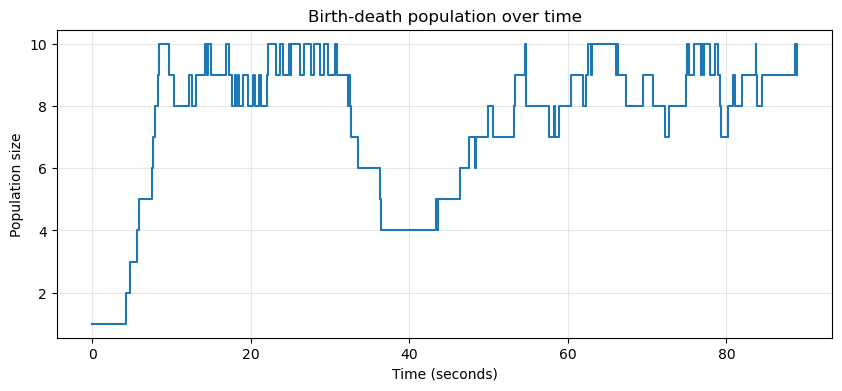

In [13]:
# =========================
# PARAMETER CELL + RUN CELL
# =========================

from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt

# ---- Project / output settings ----
song_name = "birth_death_12tone_test"
output_dir = Path("../generated/midi")
output_dir.mkdir(parents=True, exist_ok=True)
midi_path = output_dir / f"{song_name}.mid"

# ---- 12-tone material settings ----
row_seed = 42
prime_row = generate_row(modulus=12, seed=row_seed)
material = TwelveToneMaterial(prime_row=prime_row, normalise=True)

rows = [
    material.get_form("P", 0).row,
    material.get_form("I", 0).row,
    material.get_form("R", 0).row,
    material.get_form("RI", 0).row,
]

# ---- Birth-death process settings ----
config = BirthDeathConfig(
    song_length=90.0,
    initial_population=1,
    min_population=1,
    max_population=10,
    birth_rate=0.08,
    death_rate=0.06,
    note_rate_mean=2.5,
    note_rate_sd=0.35,
    seed=123,
)

# ---- MIDI rendering settings ----
bpm = 120
ticks_per_beat = 480
note_duration_seconds = 0.25
base_octave = 4
octave_span = 3
velocity = 72

# ---- Generate abstract pitch events ----
process = BirthDeathToneRowProcess(rows=rows, config=config)
pitch_events, population_events = process.run()

# ---- Render MIDI ----
saved_path = pitch_events_to_midi(
    pitch_events=pitch_events,
    output_path=midi_path,
    bpm=bpm,
    ticks_per_beat=ticks_per_beat,
    note_duration_seconds=note_duration_seconds,
    base_octave=base_octave,
    octave_span=octave_span,
    velocity=velocity,
)

# ---- Summary stats ----
pitch_df = pd.DataFrame([event.__dict__ for event in pitch_events])
pop_df = pd.DataFrame([event.__dict__ for event in population_events])

note_count = len(pitch_events)
voice_count = process.next_voice_id
unique_active_voices = pitch_df["voice_id"].nunique() if not pitch_df.empty else 0

min_population = pop_df["population_size"].min() if not pop_df.empty else 0
max_population = pop_df["population_size"].max() if not pop_df.empty else 0
mean_population = pop_df["population_size"].mean() if not pop_df.empty else 0

notes_per_second = note_count / config.song_length
notes_per_voice = note_count / unique_active_voices if unique_active_voices else 0

birth_count = (pop_df["event_type"] == "birth").sum() if not pop_df.empty else 0
death_count = (pop_df["event_type"] == "death").sum() if not pop_df.empty else 0

pitch_class_counts = (
    pitch_df["pitch_class"]
    .value_counts()
    .sort_index()
    .to_dict()
    if not pitch_df.empty
    else {}
)

print("Generated stochastic 12-tone birth-death MIDI")
print(f"MIDI path: {saved_path}")
print()
print("12-tone material")
print(f"Prime row: {prime_row}")
print(f"Base row:  {material.base_row}")
print()
print("Population stats")
print(f"Initial population: {config.initial_population}")
print(f"Final population:   {pop_df['population_size'].iloc[-1] if not pop_df.empty else 0}")
print(f"Min population:     {min_population}")
print(f"Max population:     {max_population}")
print(f"Mean population:    {mean_population:.2f}")
print(f"Total voices born:  {birth_count}")
print(f"Total deaths:       {death_count}")
print()
print("Note stats")
print(f"Total notes:        {note_count}")
print(f"Active voices used: {unique_active_voices}")
print(f"Notes per second:   {notes_per_second:.2f}")
print(f"Notes per voice:    {notes_per_voice:.2f}")
print(f"Pitch-class counts: {pitch_class_counts}")

# ---- Population line chart ----
if not pop_df.empty:
    plt.figure(figsize=(10, 4))
    plt.step(
        pop_df["time"],
        pop_df["population_size"],
        where="post",
    )
    plt.title("Birth-death population over time")
    plt.xlabel("Time (seconds)")
    plt.ylabel("Population size")
    plt.grid(True, alpha=0.3)
    plt.show()

# ---- Playback in notebook ----
play_midi_in_notebook(saved_path)